In [1]:
!pip install rasterio
!pip install kornia kornia_moons

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 75.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 55.4 MB/s eta 0:00:00


In [9]:
import os
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from rasterio.plot import reshape_as_image
import cv2
import kornia as K
import kornia.feature as KF
import torch
from kornia_moons.viz import draw_LAF_matches

In [10]:
loaded_data = pd.read_csv('images.csv', header=None).values #loading data

# Reshape each row back to (1024, 1024, 3)
images = [row.reshape((1024, 1024, 3)) for row in loaded_data]

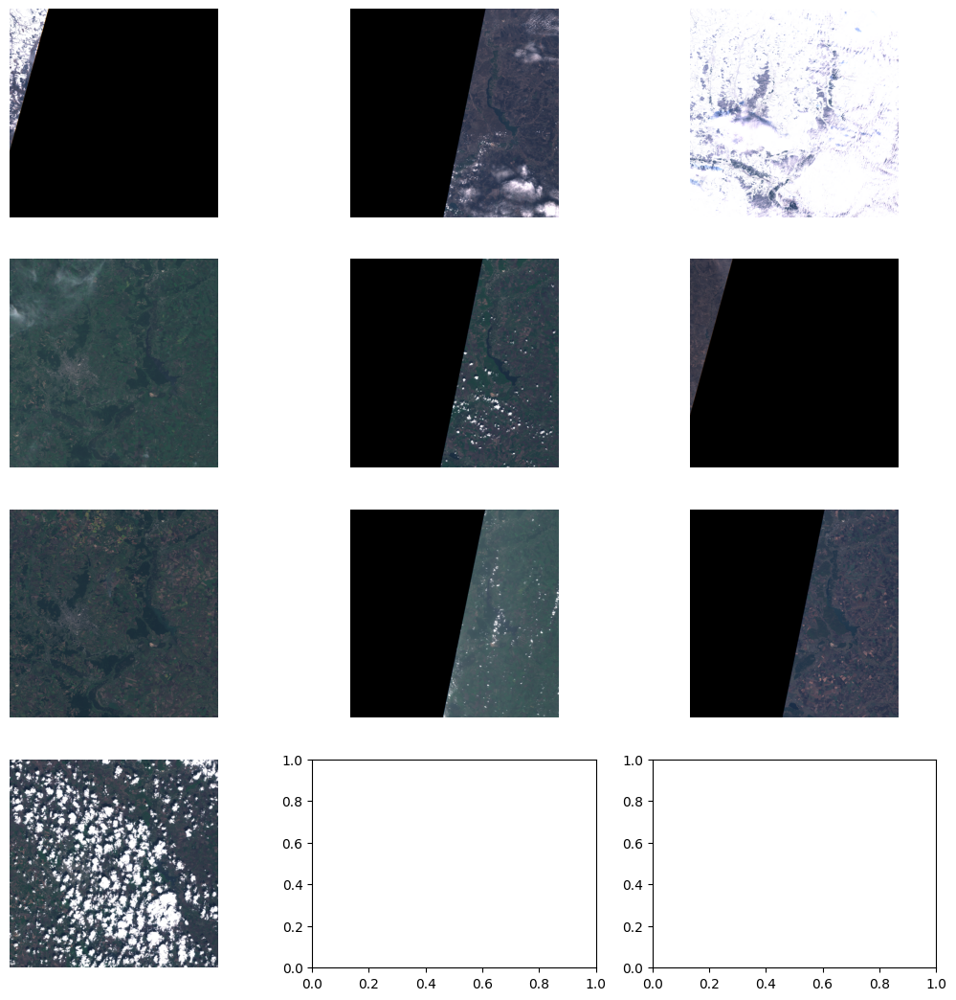

In [11]:
fig, ax = plt.subplots(ncols=3, nrows=4, figsize=(13, 13))
ax = ax.flatten()

for i, image in enumerate(images):
    ax[i].imshow(image)
    ax[i].axis('off')

plt.show()

We will work with the model created in "Algorithm_creation.py"

In [16]:
class FeatureMatcher:
    def __init__(self):
        self.loftr = KF.LoFTR(pretrained='outdoor').eval() #creating model

    #normalize data to avoid mistakes
    def normalize_image(self, image):
        normalized_image = cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
        return normalized_image
    #LoFTR model works with tensors
    def match_features(self, image1, image2):
      image1 = torch.from_numpy(image1).float().unsqueeze(0).permute(0, 3, 1, 2) / 255.0
      image2 = torch.from_numpy(image2).float().unsqueeze(0).permute(0, 3, 1, 2) / 255.0
    #LoFTR model works with gray images only
      if image1.shape[1] == 3:
        image1 = K.color.rgb_to_grayscale(image1)
      if image2.shape[1] == 3:
        image2 = K.color.rgb_to_grayscale(image2)
    #looking for matches
      with torch.inference_mode():
        input_dict = {"image0": image1, "image1": image2}
        correspondences = self.loftr(input_dict)
      keypoints0 = correspondences["keypoints0"].numpy()
      keypoints1 = correspondences["keypoints1"].numpy()
      Fm, inliers = cv2.findFundamentalMat(keypoints0, keypoints1, cv2.USAC_MAGSAC, 0.5, 0.999, 100000) #classify inliers and outliers
      inliers = inliers > 0 #getting inliers only (inliers have value of 1 whereas outliers - 0)
      return keypoints0, keypoints1, inliers, image1, image2
    #function to draw mathes
    def draw_matches(self, image1, image2, max_matches=None): #max_matches is the parameter to regulate the number of matches drawn
        image1 = self.normalize_image(image1) #normalization
        image2 = self.normalize_image(image2) #normalization

        keypoints0, keypoints1, inliers, _, _ = self.match_features(image1, image2) #getting matches

        # Subset the matches if max_matches is specified
        if max_matches is not None:
            indices = np.arange(len(keypoints0))
            np.random.shuffle(indices)
            indices = indices[:max_matches]
            keypoints0 = keypoints0[indices]
            keypoints1 = keypoints1[indices]
            inliers = inliers[indices]

        # Ensure images are in RGB for consistent drawing
        if len(image1.shape) == 2:  # Grayscale to RGB
            image1 = cv2.cvtColor(image1, cv2.COLOR_GRAY2RGB)
            image2 = cv2.cvtColor(image2, cv2.COLOR_GRAY2RGB)
        #drawing
        matched_image = draw_LAF_matches(
            KF.laf_from_center_scale_ori(
                torch.from_numpy(keypoints0).view(1, -1, 2),
                torch.ones(keypoints0.shape[0]).view(1, -1, 1, 1),
                torch.ones(keypoints0.shape[0]).view(1, -1, 1),
            ),
            KF.laf_from_center_scale_ori(
                torch.from_numpy(keypoints1).view(1, -1, 2),
                torch.ones(keypoints1.shape[0]).view(1, -1, 1, 1),
                torch.ones(keypoints1.shape[0]).view(1, -1, 1),
            ),
            torch.arange(keypoints0.shape[0]).view(-1, 1).repeat(1, 2),
            image1,
            image2,
            inliers,
            draw_dict={
                'inlier_color': (0.2, 1, 0.2),
                'tentative_color': (1, 0.1, 0.1),
                'feature_color': (0.2, 0.5, 1),
                'vertical': False,
            },
        )
        return matched_image #returns an image with drawn matches

##Feature Matching

(0.0, 2048.0, 1024.0, 0.0)

<Figure size 1000x1000 with 0 Axes>

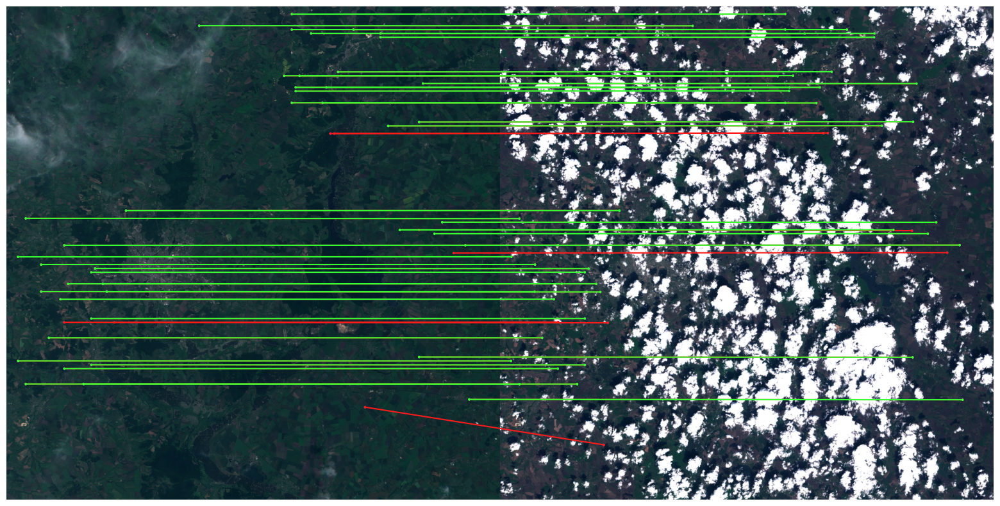

In [17]:
feature_matcher = FeatureMatcher()
plt.figure(figsize=(10, 10))
feature_matcher.draw_matches(images[3], images[9], max_matches=50)
plt.axis("off")

(0.0, 2048.0, 1024.0, 0.0)

<Figure size 1000x1000 with 0 Axes>

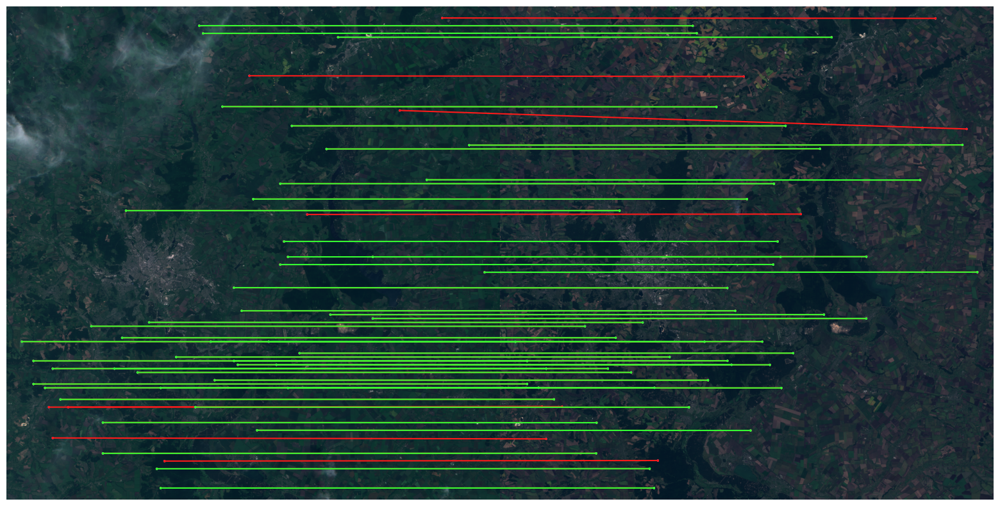

In [ ]:
plt.figure(figsize=(10, 10))
feature_matcher.draw_matches(images[3], images[6], max_matches=55)
plt.axis("off")

(0.0, 2048.0, 1024.0, 0.0)

<Figure size 1000x1000 with 0 Axes>

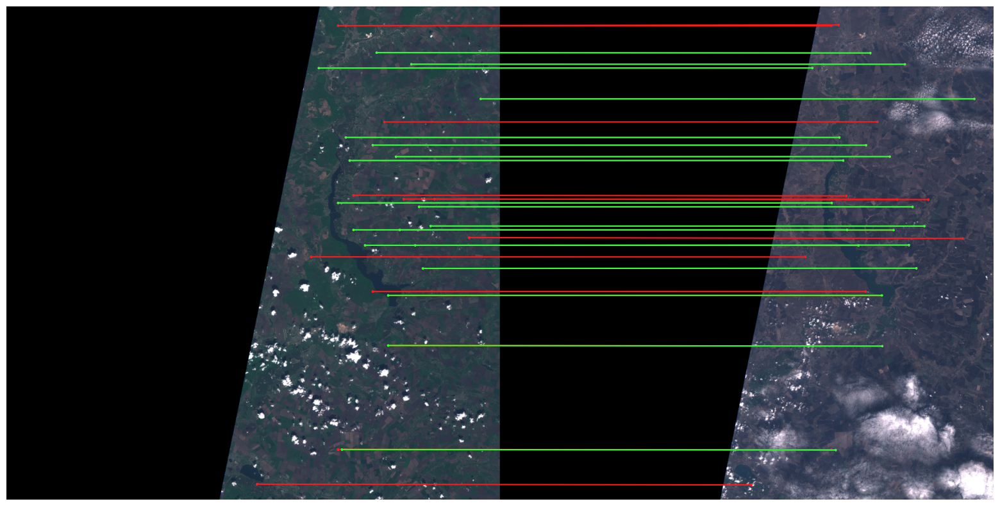

In [ ]:
plt.figure(figsize=(10, 10))
feature_matcher.draw_matches(images[4], images[1], max_matches=30)
plt.axis("off")

(0.0, 2048.0, 1024.0, 0.0)

<Figure size 1000x1000 with 0 Axes>

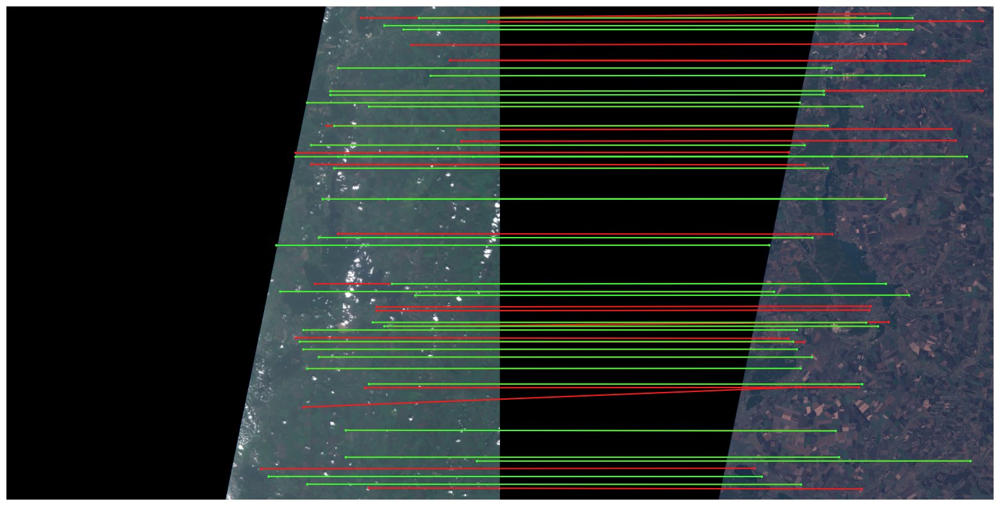

In [ ]:
plt.figure(figsize=(10, 10))
feature_matcher.draw_matches(images[7], images[8], max_matches=60)
plt.axis("off")

(0.0, 2048.0, 1024.0, 0.0)

<Figure size 1000x1000 with 0 Axes>

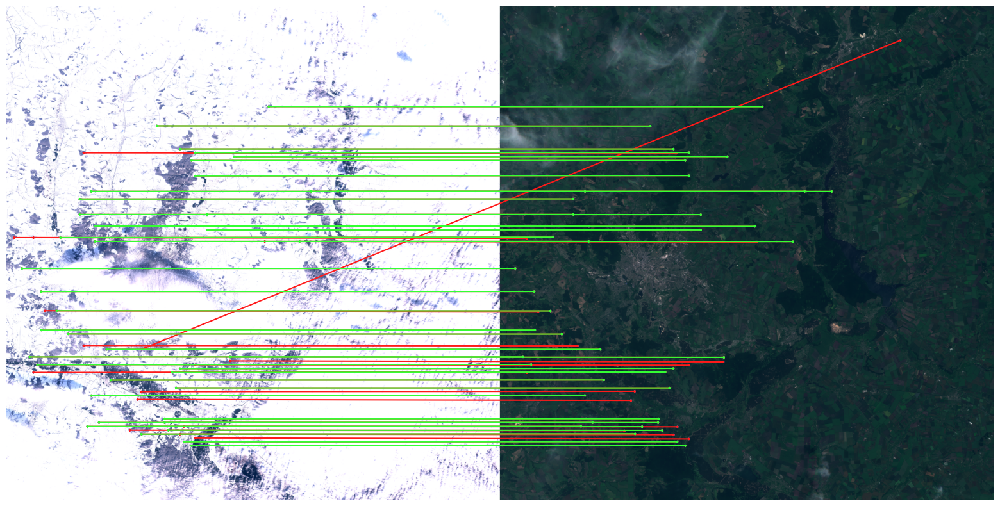

In [ ]:
plt.figure(figsize=(10, 10))
feature_matcher.draw_matches(images[2], images[3], max_matches=60)
plt.axis("off")

(0.0, 2048.0, 1024.0, 0.0)

<Figure size 1000x1000 with 0 Axes>

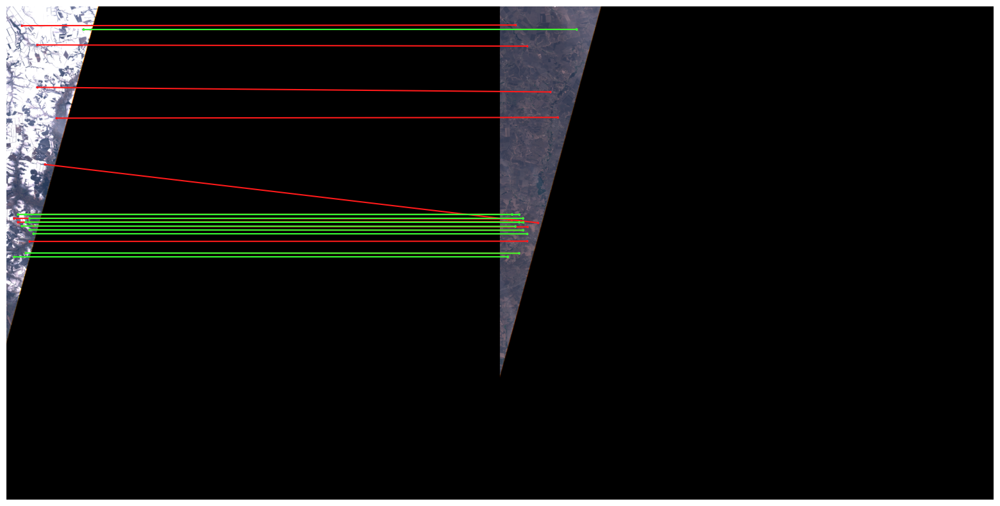

In [14]:
feature_matcher = FeatureMatcher()
plt.figure(figsize=(10, 10))
feature_matcher.draw_matches(images[0], images[5], max_matches=20)
plt.axis("off")